In [187]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sympy as smp
import plotly 
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import pickle
import edist.ted as ted
from sklearn.preprocessing import MinMaxScaler

import sys
sys.path.append("../src")

import utils
import ExpressionTree

import re

sns.set_theme("notebook")

In [22]:
def t1(X):
    return 10*np.exp(-0.5*np.exp(-0.5*X + 2))
X1 = np.linspace(-5, 15, 140)
y1 = t1(X1)

def t2(X):
    return np.exp(-X)
X2 = np.linspace(1, 20, 140)
y2 = t2(X2)

air_passengers = pd.read_csv("data/AirPassengers.csv")
X3 = air_passengers.index
y3 = air_passengers["#Passengers"]

treated_seco = pd.read_csv("data/treated_seco.csv")
treated_seco

treated_seco["eventdate"] = pd.to_datetime(treated_seco["eventdate"])
treated_seco.set_index("eventdate", inplace=True, drop=True)
treated_seco = treated_seco.asfreq("7D")
treated_seco.rename(columns={"Unnamed: 0": "weeks"}, inplace=True)

X4_origin = treated_seco.weeks.values
y4_origin = treated_seco.value.values

X4 = treated_seco.weeks[::2].values
y4 = treated_seco.value[::2].values


# sugar = yf.Ticker("SB=F")
# sugar_history = sugar.history(period="1y")
# sugar_history = sugar_history.asfreq("B")

# # Interpolando os dados
# sugar_history = sugar_history.interpolate()

# sugar_history.reset_index(inplace=True)

sugar_data_manip = pd.read_csv("data/sugar_data_manip.csv")
X5 = sugar_data_manip.X.values
y5 = sugar_data_manip.y.values

data = [
    [X1, y1],
    [X2, y2],
    [X3, y3],
    [X4, y4],
    [X5, y5]
]

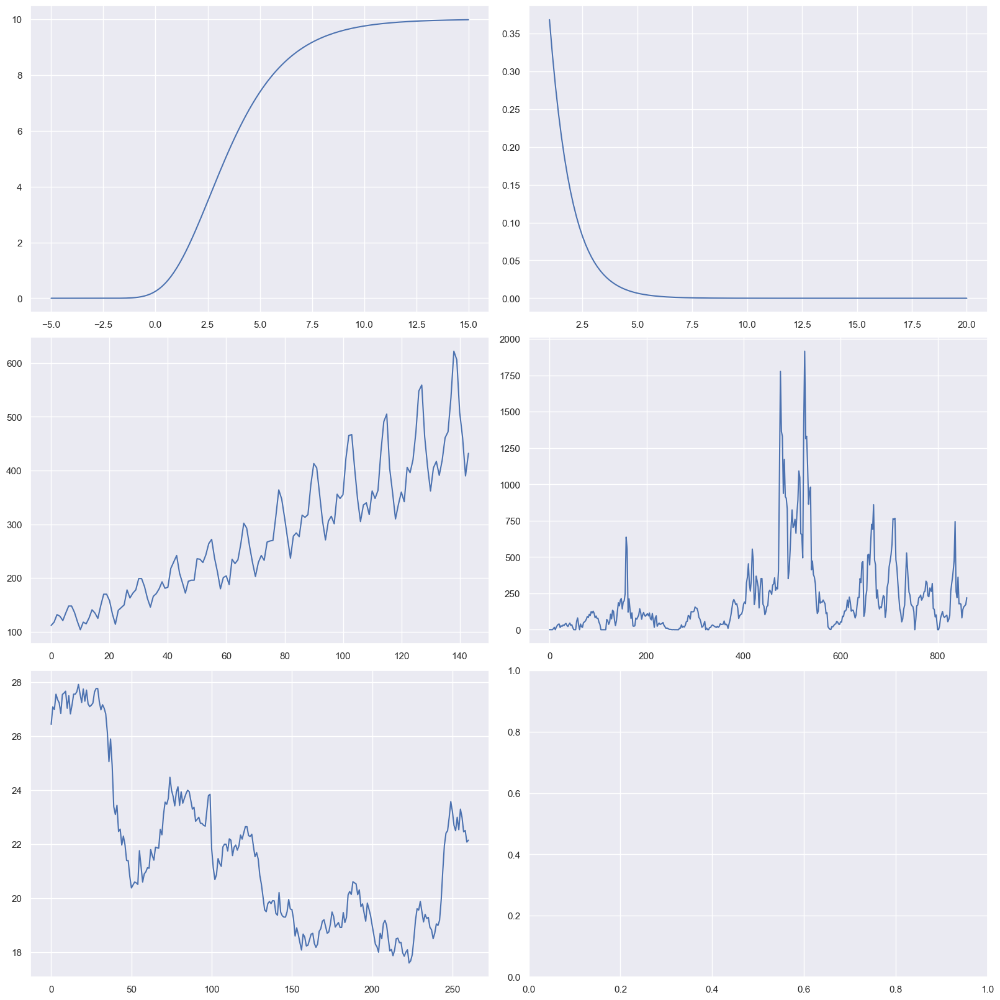

In [188]:
fig, axs = plt.subplots(3, 2, constrained_layout=True, figsize=(16, 16))

for ax, current_data in zip(axs.flatten(), data):
    ax.plot(current_data[0], current_data[1])

In [24]:
def create_df(path):
    with open(path, "rb") as file:
        air_info = pickle.load(file)

    interval = list(air_info.keys())
    funcs = list(air_info.values())

    air_df = pd.DataFrame()
    air_df["interval"] = interval
    air_df["func"] = funcs


    x0 = smp.symbols("x0")
    air_lamb = []

    for i, row in air_df.iterrows():
        lamb = smp.lambdify([x0], row.func)   
        air_lamb.append(lamb)

    air_df["lamb"] = air_lamb

    starts, ends, iters = [], [], []
    pattern = re.compile(r"\d+")
    for row in air_df["interval"]:
        start, end, it = pattern.findall(row)
        
        starts.append(int(start))
        ends.append(int(end))
        iters.append(int(it))

    air_df["start"] = starts
    air_df["end"] = ends
    air_df["iteration"] = iters
    air_df.drop("interval", axis=1, inplace=True)

    sizes = []
    for row in air_df["func"]:
        size = len(utils.exprToTree(row))
        sizes.append(int(size))

    air_df["size"] = sizes

    return air_df

In [25]:
dfs = []
for i in range(0, 2):
    path = rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Airplane\RollingMetric-120-85-{i}.pkl"
    df = create_df(path)
    dfs.append(df)

In [26]:
air_df = pd.concat(dfs).sort_values("end").reset_index(drop=True)
air_df.head()

,func,lamb,start,end,iteration,size
0,(x0 + 286.20352*exp(sin(0.537315890053563*x0))...,<function _lambdifygenerated at 0x00000238A67D...,120,85,1,19
1,(x0 + (x0 + 18.1020192150762*sin(x0) + 183.273...,<function _lambdifygenerated at 0x00000238A677...,120,85,0,26
2,(0.3149186*x0 - 20.8247973569416)*exp(exp(-sin...,<function _lambdifygenerated at 0x00000238A677...,120,85,0,18
3,2.0*x0 + 11.299152*exp(exp(sin(0.5072112*x0)))...,<function _lambdifygenerated at 0x00000238A677...,120,86,0,14
4,x0 + 62.3682101984737*sin(0.508369593641883*x0...,<function _lambdifygenerated at 0x00000238A677...,120,86,1,17


In [245]:
air_df["window_size"] = air_df["start"] - air_df["end"]

# Complexity

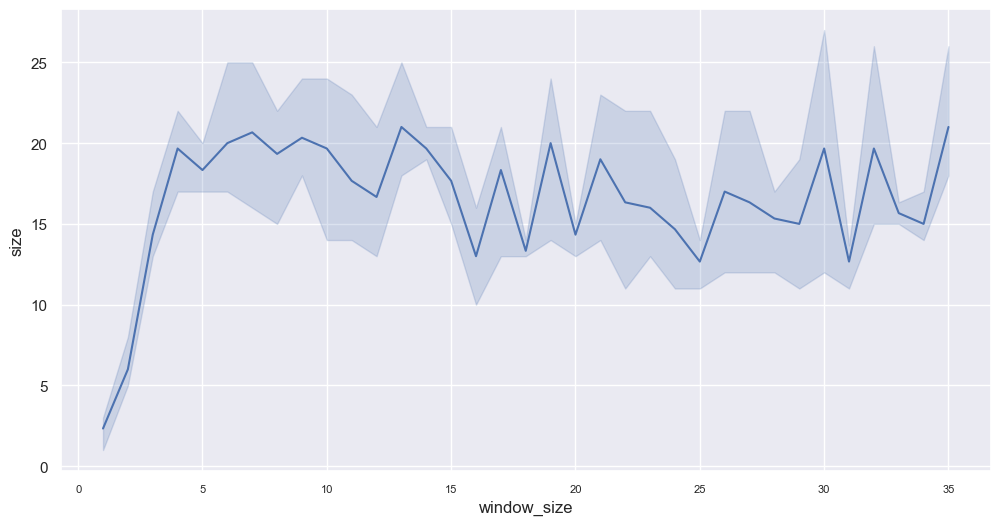

In [246]:
plt.figure(figsize=(12, 6))
sns.lineplot(air_df, x="window_size", y="size")
plt.xticks(fontsize=8)
# plt.gca().invert_xaxis()
plt.show()

2024-10-20 21:10:34,636 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-10-20 21:10:34,642 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


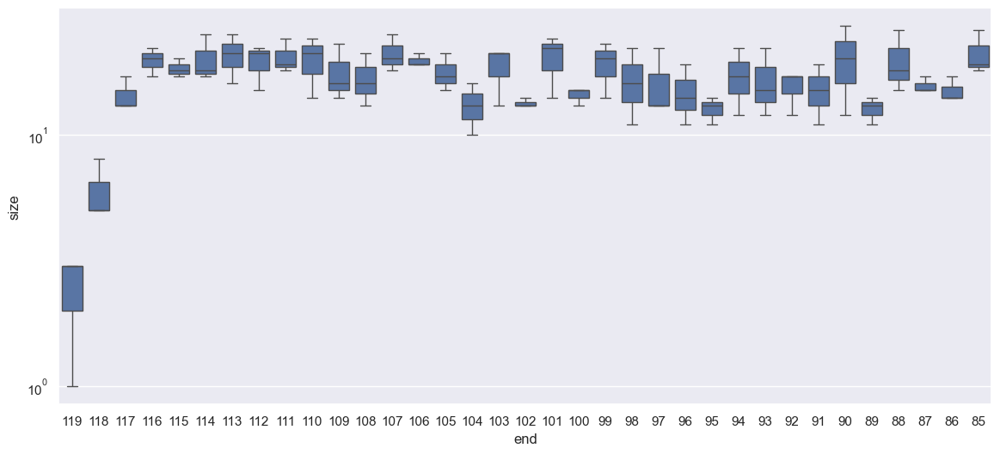

In [236]:
plt.figure(figsize=(14,6))
sns.boxplot(data=air_df, x="end", y="size")
# sns.lineplot(air_df, x="end", y="size")
plt.yscale("log")
plt.gca().invert_xaxis()

# MSE

In [29]:
def calculate_MSE(X, y, a, b, func):
    X = X[a:b]
    y = y[a:b]
    y_pred = func(X)

    return np.mean((y - y_pred)**2)

In [30]:
MSEs = []
for i, row in air_df.iterrows():
    MSE = calculate_MSE(X3, y3, row.end, row.start, row.lamb)
    MSEs.append(MSE)

air_df["MSE"] = MSEs

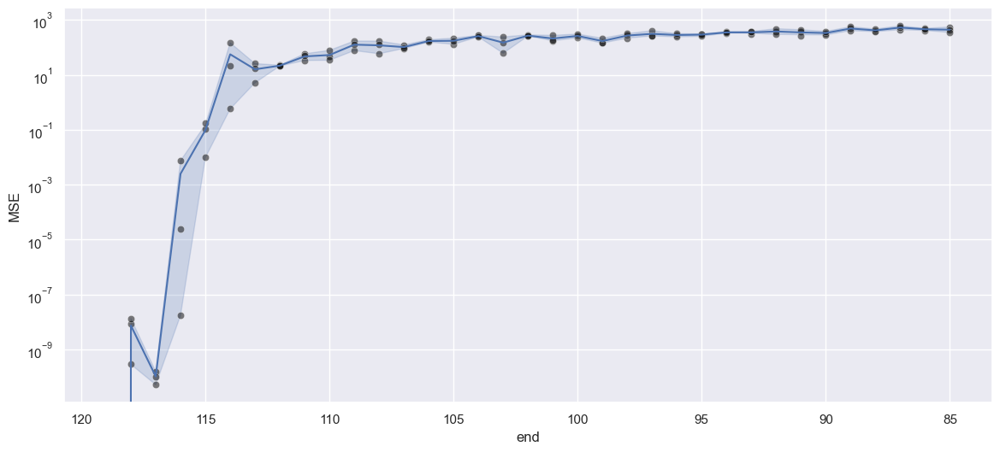

In [191]:
plt.figure(figsize=(14, 6))
sns.lineplot(air_df, x="end", y="MSE")
sns.scatterplot(air_df, x="end", y="MSE", alpha=0.5, c="black")
plt.yscale("log")
plt.gca().invert_xaxis()

2024-10-20 19:12:58,332 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


2024-10-20 19:12:58,342 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


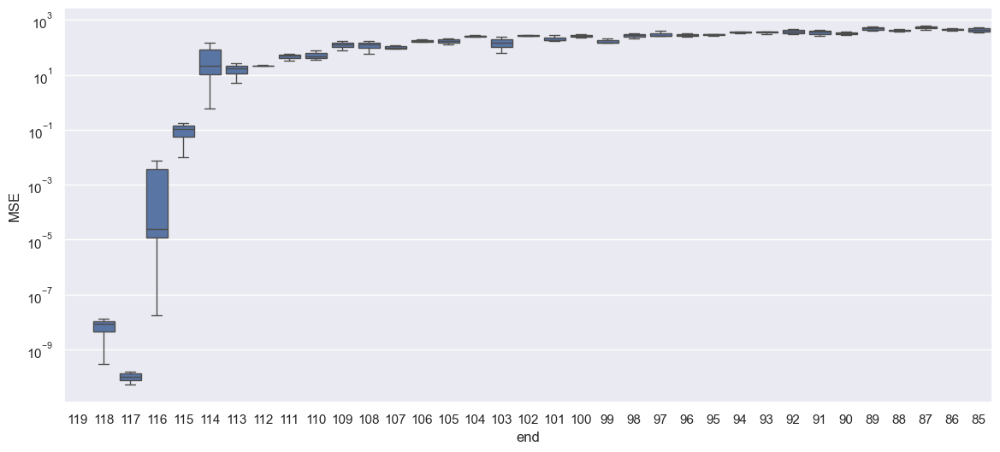

In [192]:
plt.figure(figsize=(14, 6))
sns.boxplot(air_df, x="end", y="MSE")
plt.yscale("log")
plt.gca().invert_xaxis()

In [247]:
fig = px.box(air_df, x="end", y="MSE")

fig.update_layout(
    yaxis_type="log",  # Logarithmic scale for MSE
    width=1200, 
    height=600,
    xaxis=dict(autorange="reversed"),  # Invert x-axis

    yaxis=dict(
        exponentformat="power",  # Show ticks as powers of 10
    )
)

fig.show()

## Graphical Analysis

In [33]:
air_df_filtered = air_df[air_df["end"] <= 105]

import plotly.graph_objects as go

# Create a figure
fig = go.Figure()

#Calculate ys
ys = []
X_range = np.linspace(0, 400, 401)

for i, row in air_df_filtered.iterrows():
    y = row.lamb(X_range)

    try:
        len(y)
    except:
        y = [y for _ in X_range]

    ys.append(y)

# Add traces for each Y column
c = 0
for i, row in air_df_filtered.iterrows():
    fig.add_trace(go.Scatter(x=X_range, y=ys[c], name=f"{c}"))
    c += 1

# Create dropdown
# Set the initial y-axis range
fig.update_layout(yaxis=dict(range=[-200, 600]))  # Default y-axis range

fig.update_layout(
    width=1200,  # Set the width of the plot
    height=600,  # Set the height of the plot
)

# Add slider for controlling the y-axis range
fig.update_layout(
    sliders=[
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Min: '},
            'pad': {'t': 50},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[0]': i}]} 
                for i in range(-200, 200)  # Min y value range (0 to 20)
            ]
        },
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Max: '},
            'pad': {'t': 100},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[1]': i}]} 
                for i in range(0, 700)  # Max y value range (20 to 50)
            ]
        }
    ]
)

# Set the title and display the figure
fig.update_layout(title='Interactive Data Selection')
fig.show()




<lambdifygenerated-76>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-68>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-64>:2: RuntimeWarning:

divide by zero encountered in divide



In [193]:
filtered = air_df[air_df["iteration"] == 0]
filtered.head()

,func,lamb,start,end,iteration,size,MSE
1,(x0 + (x0 + 18.1020192150762*sin(x0) + 183.273...,<function _lambdifygenerated at 0x00000238A677...,120,85,0,26,418.720879
2,(0.3149186*x0 - 20.8247973569416)*exp(exp(-sin...,<function _lambdifygenerated at 0x00000238A677...,120,85,0,18,350.089963
3,2.0*x0 + 11.299152*exp(exp(sin(0.5072112*x0)))...,<function _lambdifygenerated at 0x00000238A677...,120,86,0,14,492.938125
5,x0 + 11.3903134860549*exp(exp(-cos(0.521923528...,<function _lambdifygenerated at 0x00000238A677...,120,86,0,14,465.670194
7,x0 + 49.0290170883285*sin(0.508340624208736*x0...,<function _lambdifygenerated at 0x00000238A6E1...,120,87,0,17,530.962898


In [194]:
import plotly.graph_objects as go

# Create a figure
fig = go.Figure()

#Calculate ys
ys = []
X_range = np.linspace(0, 400, 401)

for i, row in air_df[air_df["iteration"] == 1].iterrows():
    y = row.lamb(X_range)

    try:
        len(y)
    except:
        y = [y for _ in X_range]

    ys.append(y)

# Add traces for each Y column
c = 0
for i, row in air_df[air_df["iteration"] == 1].iterrows():
    fig.add_trace(go.Scatter(x=X_range, y=ys[c], name=f"{c}"))
    c += 1

# Create dropdown
# Set the initial y-axis range
fig.update_layout(yaxis=dict(range=[-200, 600]))  # Default y-axis range

fig.update_layout(
    width=1200,  # Set the width of the plot
    height=600,  # Set the height of the plot
)

# Add slider for controlling the y-axis range
fig.update_layout(
    sliders=[
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Min: '},
            'pad': {'t': 50},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[0]': i}]} 
                for i in range(-200, 200)  # Min y value range (0 to 20)
            ]
        },
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Max: '},
            'pad': {'t': 100},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[1]': i}]} 
                for i in range(0, 700)  # Max y value range (20 to 50)
            ]
        }
    ]
)

# Set the title and display the figure
fig.update_layout(title='Interactive Data Selection')
fig.show()



<lambdifygenerated-63>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-57>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-43>:2: RuntimeWarning:

invalid value encountered in divide



In [210]:
import plotly.graph_objects as go

air_df_invert = air_df.sort_values("end", ascending=False)

# Create a figure
fig = go.Figure()

#Calculate ys
ys = []
X_range = np.linspace(0, 400, 401)

for i, row in air_df_invert.iterrows():
    y = row.lamb(X_range)

    try:
        len(y)
    except:
        y = [y for _ in X_range]

    ys.append(y)

# Add traces for each Y column
c = 0
for i, row in air_df_invert.iterrows():
    fig.add_trace(go.Scatter(x=X_range, y=ys[c], name=f"{c}",
                             visible=True if i == len(air_df_invert)-1 else False  # Initially show only the first line
                             ))
    c += 1

# Create steps for the slider, each controlling how many lines are shown
num_lines = len(air_df_invert)
steps = []
for i in range(num_lines):
    step = dict(
        method="update",
        args=[{"visible": [j <= i for j in range(num_lines)]},  # Show lines up to the ith one
              {"title": f"Showing {i+1} lines"}],  # Update plot title
        label=f"{i+1}"
    )
    steps.append(step)

# Create dropdown
# Set the initial y-axis range
fig.update_layout(yaxis=dict(range=[-200, 600]))  # Default y-axis range

fig.update_layout(
    width=1200,  # Set the width of the plot
    height=600,  # Set the height of the plot
)

# Add slider to the layout
sliders = [dict(
    active=0,
    currentvalue={"prefix": "Number of lines: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders,
    width=1000,
    height=600
)


# Set the title and display the figure
# fig.update_layout(title='Interactive Data Selection')
fig.show()



In [212]:
import plotly.graph_objects as go

air_df_filtered = air_df[air_df["end"] <= 105]
air_df_invert = air_df_filtered.sort_values("end", ascending=False)

# Create a figure
fig = go.Figure()

#Calculate ys
ys = []
X_range = np.linspace(0, 400, 401)

for i, row in air_df_invert.iterrows():
    y = row.lamb(X_range)

    try:
        len(y)
    except:
        y = [y for _ in X_range]

    ys.append(y)

# Add traces for each Y column
c = 0
for i, row in air_df_invert.iterrows():
    fig.add_trace(go.Scatter(x=X_range, y=ys[c], name=f"{c}",
                             visible=True if i == len(air_df_invert)-1 else False  # Initially show only the first line
                             ))
    c += 1

# Create steps for the slider, each controlling how many lines are shown
num_lines = len(air_df_invert)
steps = []
for i in range(num_lines):
    step = dict(
        method="update",
        args=[{"visible": [j <= i for j in range(num_lines)]},  # Show lines up to the ith one
              {"title": f"Showing {i+1} lines"}],  # Update plot title
        label=f"{i+1}"
    )
    steps.append(step)

# Create dropdown
# Set the initial y-axis range
fig.update_layout(yaxis=dict(range=[-200, 600]))  # Default y-axis range

fig.update_layout(
    width=1200,  # Set the width of the plot
    height=600,  # Set the height of the plot
)

# Add slider to the layout
sliders = [dict(
    active=0,
    currentvalue={"prefix": "Number of lines: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders,
    width=1000,
    height=600
)


# Set the title and display the figure
# fig.update_layout(title='Interactive Data Selection')
fig.show()



<lambdifygenerated-64>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-68>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-76>:2: RuntimeWarning:

divide by zero encountered in divide



## Dispersion

In [37]:
np.arange(100, 250)

array([100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112,
       113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
       126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138,
       139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151,
       152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164,
       165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177,
       178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
       191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203,
       204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216,
       217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229,
       230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242,
       243, 244, 245, 246, 247, 248, 249])

In [101]:
def find_matches(dataframe, x_range):
    matches = []
    indexes = []
    range_array = np.arange(x_range[0], x_range[1])

    for c in range_array:
        ys = []
        for i, row in dataframe.iterrows():
            y = row.lamb(c)
            ys.append(y)
        
        matches.append(ys)
        indexes.append(c)

    return pd.DataFrame({"indexes": indexes, "matches": matches})
           
air_match_df = find_matches(air_df_filtered, (0, 200))

<lambdifygenerated-76>:2: RuntimeWarning:

divide by zero encountered in scalar divide

<lambdifygenerated-68>:2: RuntimeWarning:

divide by zero encountered in scalar divide

<lambdifygenerated-64>:2: RuntimeWarning:

divide by zero encountered in scalar divide



In [102]:
stds = []
for i, row in air_match_df.iterrows():
    filtered = np.array(row.matches)[np.isfinite(row.matches)]
    std = np.nanstd(filtered)
    stds.append(std)

air_match_df["std"] = stds

In [153]:
air_exploded = air_match_df.explode("matches")
air_exploded['matches'] = pd.to_numeric(air_exploded['matches'])
air_exploded.reset_index(drop=True, inplace=True)

In [154]:
fig = px.line(air_match_df, x="indexes", y="std", log_y=True)

fig.update_layout(
    yaxis=dict(
        exponentformat="power",  # Show ticks as powers of 10
    )
)

fig.show()

In [253]:
# fig.update_layout(boxmode = "overlay")
fig = px.box(air_exploded, x="indexes", y="matches",
            width=1400, height=600)
fig.show()

In [251]:
air_df["window_size"].max()

35

# Seco

In [214]:
dfs = []
for i in range(0, 2):
    path = rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Seco\RollingMetric-108-49-{i}.pkl"
    df = create_df(path)
    dfs.append(df)

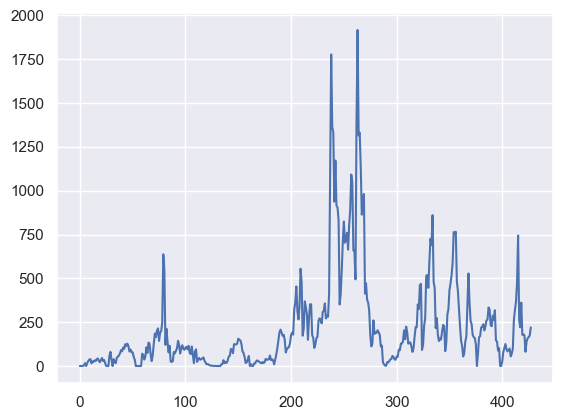

In [215]:
len(X4)
X4_new = np.linspace(0, 427, 428)
plt.plot(X4_new, y4)

In [216]:
import plotly.graph_objects as go

# Assuming X4 and y4 are already defined

fig = go.Figure()

# Plot the full dataset
fig.add_trace(go.Scatter(x=X4_origin, y=y4_origin, mode='lines', name='Full Data'))

# Plot the subset (index 49 to 107)
fig.add_trace(go.Scatter(x=X4_origin[167:216], y=y4_origin[167:216], mode='lines', name='Subset'))

# Customize the layout (optional)
fig.update_layout(
    title="Plot with Subset",
    xaxis_title="X-axis",
    yaxis_title="Y-axis",
    width=800,
    height=600
)

# Show the figure
fig.show()


In [217]:
seco_df = pd.concat(dfs).sort_values("end").reset_index(drop=True)
seco_df.head()

,func,lamb,start,end,iteration,size
0,x0/(exp(cos(exp(-cos(56.4880764120988*x0))*sin...,<function _lambdifygenerated at 0x00000238B7E6...,108,49,1,23
1,x0*exp(-cos(exp(cos(0.08059247*x0))))*cos(sin(...,<function _lambdifygenerated at 0x00000238B7E6...,108,49,0,17
2,x0*exp(-sin(2.54344813483225*sin(exp(sin(0.090...,<function _lambdifygenerated at 0x00000238B76F...,108,49,0,21
3,1.31984196159558*x0*exp(cos(4.0086827*sin(2.45...,<function _lambdifygenerated at 0x00000238B76F...,108,50,0,15
4,x0*exp(sin(0.090456806*x0))*sin(exp(-sin(0.155...,<function _lambdifygenerated at 0x00000238B7E6...,108,50,1,16


In [218]:
seco_df["end"].describe()

count    177.000000
mean      78.000000
std       17.077697
min       49.000000
25%       63.000000
50%       78.000000
75%       93.000000
max      107.000000
Name: end, dtype: float64

In [219]:
seco_df_filtered = seco_df[seco_df["end"] <= 70]

fig = go.Figure()

X_range = np.linspace(0, 300, 301)
for i, row in seco_df_filtered.iterrows():
    y = row.lamb(X_range)

    try:
        len(y)
    except:
        y = [y for _ in X_range]

    # plt.plot(X_range, y)
    fig.add_trace(go.Scatter(x=X_range, y=y, name=f"{i}"))

fig.update_layout(yaxis=dict(range=[-200, 600]))  # Default y-axis range

fig.update_layout(
    width=1200,  # Set the width of the plot
    height=600,  # Set the height of the plot
)

# Add slider for controlling the y-axis range
fig.update_layout(
    sliders=[
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Min: '},
            'pad': {'t': 50},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[0]': i}]} 
                for i in range(-1000, 0)  # Min y value range (0 to 20)
            ]
        },
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Max: '},
            'pad': {'t': 100},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[1]': i}]} 
                for i in range(0, 1000)  # Max y value range (20 to 50)
            ]
        }
    ]
)

# Set the title and display the figure
fig.update_layout(title='Interactive Data Selection')


fig.show()

<lambdifygenerated-161>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-264>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-154>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-153>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-256>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-151>:2: RuntimeWarning:

invalid value encountered in divide

<lambdifygenerated-253>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-253>:2: RuntimeWarning:

invalid value encountered in cos

<lambdifygenerated-145>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-244>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-144>:2: RuntimeWarning:

divide by zero encountered in divide



In [220]:
fig = go.Figure()

X_range = np.linspace(0, 300, 301)
for i, row in seco_df.iterrows():
    y = row.lamb(X_range)

    try:
        len(y)
    except:
        y = [y for _ in X_range]

    # plt.plot(X_range, y)
    fig.add_trace(go.Scatter(x=X_range, y=y, name=f"{i}"))

fig.update_layout(yaxis=dict(range=[-200, 600]))  # Default y-axis range

fig.update_layout(
    width=1200,  # Set the width of the plot
    height=600,  # Set the height of the plot
)

# Add slider for controlling the y-axis range
fig.update_layout(
    sliders=[
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Min: '},
            'pad': {'t': 50},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[0]': i}]} 
                for i in range(-1000, 0)  # Min y value range (0 to 20)
            ]
        },
        {
            'active': 0,
            'currentvalue': {'prefix': 'Y-axis Max: '},
            'pad': {'t': 100},
            'steps': [
                {'label': str(i), 'method': 'relayout', 'args': [{'yaxis.range[1]': i}]} 
                for i in range(0, 1000)  # Max y value range (20 to 50)
            ]
        }
    ]
)

# Set the title and display the figure
fig.update_layout(title='Interactive Data Selection')


fig.show()

<lambdifygenerated-142>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-142>:2: RuntimeWarning:

invalid value encountered in add

<lambdifygenerated-237>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-237>:2: RuntimeWarning:

invalid value encountered in sin

<lambdifygenerated-140>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-140>:2: RuntimeWarning:

overflow encountered in exp

<lambdifygenerated-138>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-227>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-227>:2: RuntimeWarning:

invalid value encountered in sin

<lambdifygenerated-219>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-132>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-131>:2: RuntimeWarning:

divide by zero encountered in divide

<lambdifygenerated-214>:2: RuntimeWar

In [221]:
import plotly.graph_objects as go

seco_df_filtered = seco_df[seco_df["end"] <= 70]
seco_df_invert = seco_df_filtered.sort_values("end", ascending=False)

# Create a figure
fig = go.Figure()

#Calculate ys
ys = []
X_range = np.linspace(0, 400, 401)

for i, row in seco_df_invert.iterrows():
    y = row.lamb(X_range)

    try:
        len(y)
    except:
        y = [y for _ in X_range]

    ys.append(y)

# Add traces for each Y column
c = 0
for i, row in seco_df_invert.iterrows():
    fig.add_trace(go.Scatter(x=X_range, y=ys[c], name=f"{c}",
                             visible=True if i == len(seco_df_invert)-1 else False  # Initially show only the first line
                             ))
    c += 1

# Create steps for the slider, each controlling how many lines are shown
num_lines = len(seco_df_invert)
steps = []
for i in range(num_lines):
    step = dict(
        method="update",
        args=[{"visible": [j <= i for j in range(num_lines)]},  # Show lines up to the ith one
              {"title": f"Showing {i+1} lines"}],  # Update plot title
        label=f"{i+1}"
    )
    steps.append(step)

# Create dropdown
# Set the initial y-axis range
fig.update_layout(yaxis=dict(range=[-200, 600]))  # Default y-axis range

fig.update_layout(
    width=1200,  # Set the width of the plot
    height=600,  # Set the height of the plot
)

# Add slider to the layout
sliders = [dict(
    active=0,
    currentvalue={"prefix": "Number of lines: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders,
    width=1000,
    height=600
)


# Set the title and display the figure
# fig.update_layout(title='Interactive Data Selection')
fig.show()



# Complexity

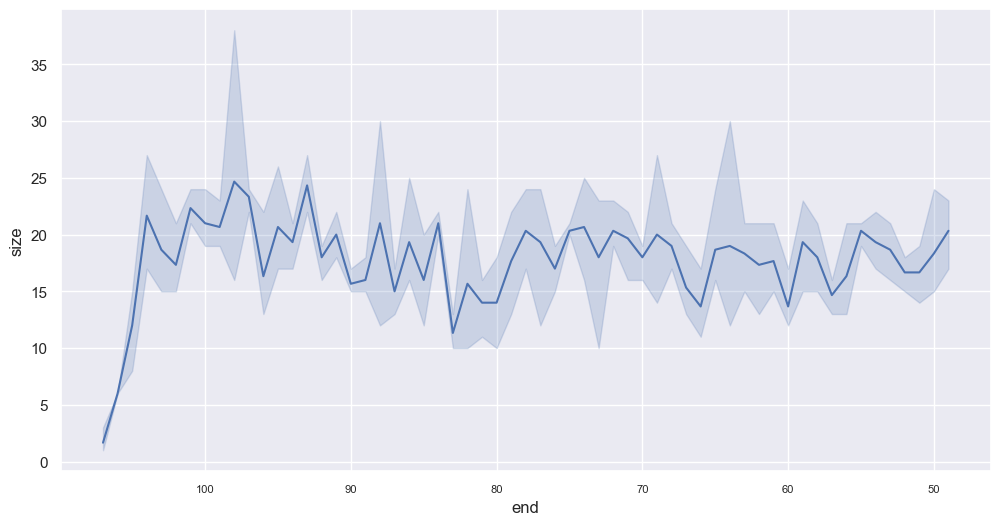

In [222]:
plt.figure(figsize=(12, 6))
sns.lineplot(seco_df, x="end", y="size")
plt.xticks(fontsize=8)
plt.gca().invert_xaxis()
plt.show()

2024-10-20 20:13:56,486 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-10-20 20:13:56,525 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


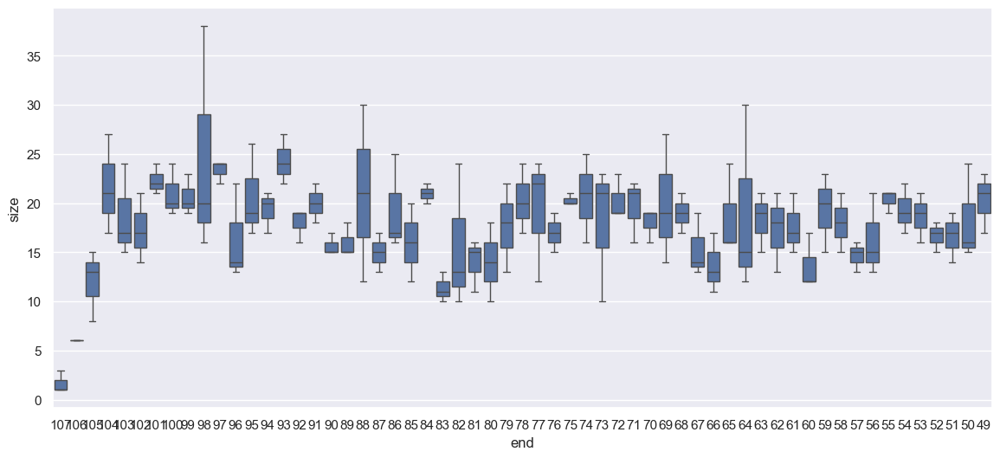

In [223]:
plt.figure(figsize=(14,6))
# sns.lineplot(data=seco_df, x="end", y="size", c="black", linestyle="--", errorbar=None)
sns.boxplot(data=seco_df, x="end", y="size")
# plt.yscale("log")
plt.gca().invert_xaxis()

# MSE

In [224]:
def calculate_MSE(X, y, a, b, func):
    X = X[a:b]
    y = y[a:b]
    y_pred = func(X)

    return np.mean((y - y_pred)**2)

In [225]:
MSEs = []
for i, row in seco_df.iterrows():
    MSE = calculate_MSE(X4, y4, row.end, row.start, row.lamb)
    MSEs.append(MSE)

seco_df["MSE"] = MSEs

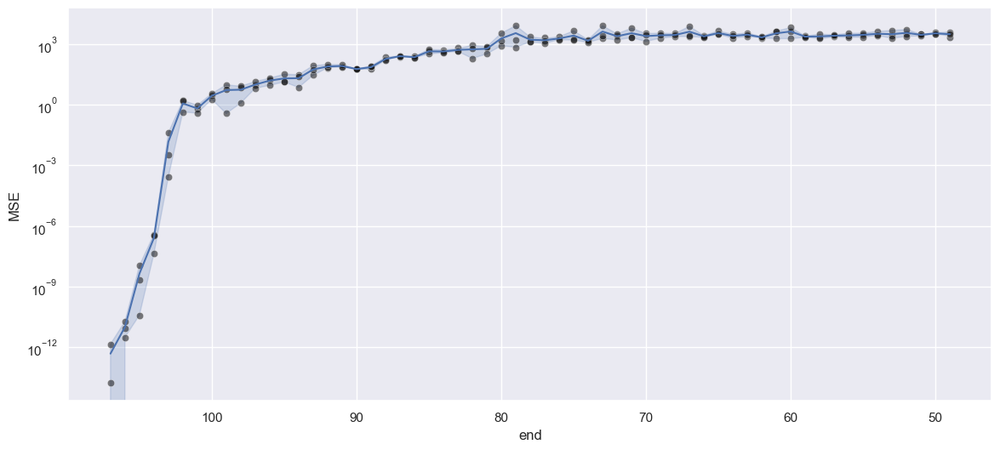

In [226]:
plt.figure(figsize=(14, 6))
sns.lineplot(seco_df, x="end", y="MSE")
sns.scatterplot(seco_df, x="end", y="MSE", alpha=0.5, c="black")
plt.yscale("log")
plt.gca().invert_xaxis()

2024-10-20 20:14:00,054 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-10-20 20:14:00,059 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


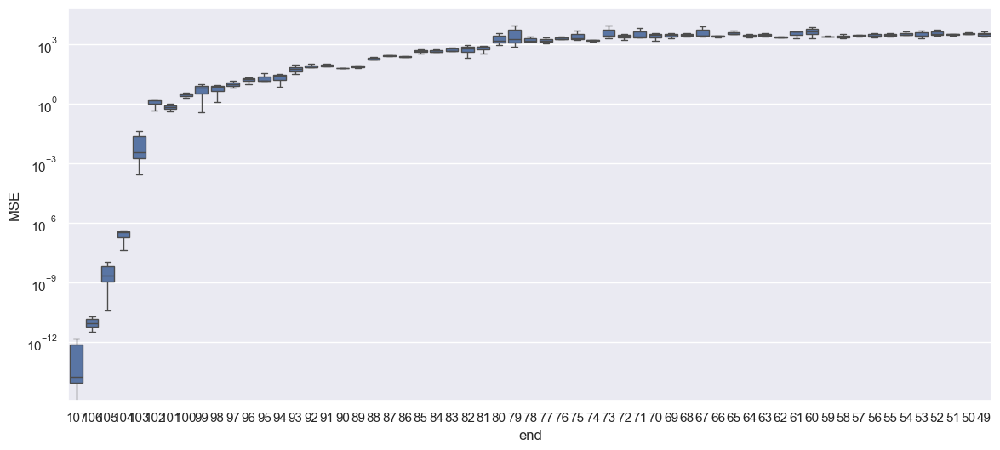

In [227]:
plt.figure(figsize=(14, 6))
sns.boxplot(seco_df, x="end", y="MSE")
plt.yscale("log")
plt.gca().invert_xaxis()